In [ ]:
from google.colab import drive

drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#Pasta raiz para as imagens
RAIZ =

#Pasta das imagens
IMG_BINA = RAIZ + "Imagens Binarias/"
IMG_GRAY = RAIZ + "Imagens Tom Cinza/"

# Bibliotecas

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Funções gerais

In [ ]:
def carregar_imagem(img, grayscale):

  if grayscale:

    img = cv2.imread(img, cv2.IMREAD_GRAYSCALE)

  else:

    img = cv2.imread(img, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

  return img

In [ ]:
def ruido_artificial(img, prob):

  ruido = img.copy()
  num_pixels = int(prob * img.size)

  #Ruido branco
  coords = [
      np.random.randint(0, img.shape[0], num_pixels),
      np.random.randint(0, img.shape[1], num_pixels)
  ]
  ruido[coords[0], coords[1]] = 255

  #Ruido preto
  coords = [
      np.random.randint(0, img.shape[0], num_pixels),
      np.random.randint(0, img.shape[1], num_pixels)
  ]
  ruido[coords[0], coords[1]] = 0

  return ruido

In [ ]:
def magnitude_gradiente(gx, gy):

  mag = np.sqrt((gx.astype(np.float32) ** 2) + (gy.astype(np.float32) ** 2))
  mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)

  return mag.astype(np.uint8)

In [ ]:
def calcula_histograma(img, num_bins=256):

  hist = cv2.calcHist([img], [0], None, [num_bins], [0, 256]).ravel()

  return hist

# Questão 1

Aplique o filtro da média em imagens utilizando máscaras de diferentes tamanhos (3×3, 5×5, 7×7)

In [ ]:
def filtro_media(img, k):

  return cv2.blur(img, (k, k))

In [ ]:
def mostrar_resultados(img_orig, img_3, img_5, img_7):

  plt.figure(figsize=(16, 4))

  plt.subplot(1, 4, 1)
  plt.imshow(img_orig, cmap='gray')
  plt.title("Original")
  plt.axis('off')

  plt.subplot(1, 4, 2)
  plt.imshow(img_3, cmap='gray')
  plt.title("Média 3×3")
  plt.axis('off')

  plt.subplot(1, 4, 3)
  plt.imshow(img_5, cmap='gray')
  plt.title("Média 5×5")
  plt.axis('off')

  plt.subplot(1, 4, 4)
  plt.imshow(img_7, cmap='gray')
  plt.title("Média 7×7")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [ ]:
def questao_1_resultado(img):

  media_3 = filtro_media(img, 3)
  media_5 = filtro_media(img, 5)
  media_7 = filtro_media(img, 7)

  mostrar_resultados(img, media_3, media_5, media_7)

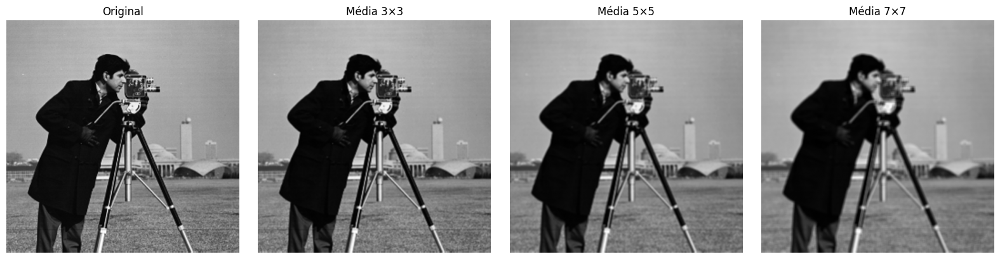

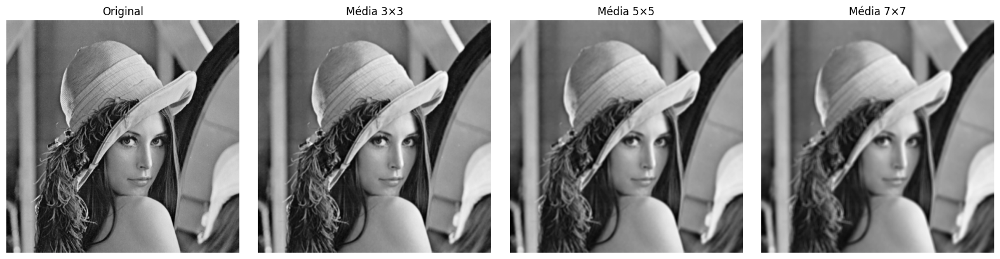

In [ ]:
camera_q1 = IMG_GRAY + "cameraman.tif"
lena_q1 = IMG_GRAY + "lena_color_512.tif"

gray = True

img = carregar_imagem(camera_q1, gray)
questao_1_resultado(img)

img = carregar_imagem(lena_q1, gray)
questao_1_resultado(img)

# Questão 2

Implemente o filtro da mediana para redução de ruídos impulsivos e compare
com o filtro da média.

In [ ]:
def filtro_mediana(img, k):

  return cv2.medianBlur(img, k)

In [ ]:
def mostrar_resultados_q2(img_orig, img_ruido, media, mediana, k):

  plt.figure(figsize=(16, 4))

  plt.subplot(1, 4, 1)
  plt.imshow(img_orig, cmap='gray')
  plt.title("Original")
  plt.axis('off')

  plt.subplot(1, 4, 2)
  plt.imshow(img_ruido, cmap='gray')
  plt.title("Ruido artificial")
  plt.axis('off')

  plt.subplot(1, 4, 3)
  plt.imshow(media, cmap='gray')
  plt.title(f"Média {k}×{k}")
  plt.axis('off')

  plt.subplot(1, 4, 4)
  plt.imshow(mediana, cmap='gray')
  plt.title(f"Mediana {k}×{k}")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [ ]:
def questao_2_resultado(img, k):

  img_ruido = ruido_artificial(img, 0.2)

  media = filtro_media(img_ruido, k)
  mediana = filtro_mediana(img_ruido, k)

  mostrar_resultados_q2(img, img_ruido, media, mediana, k)

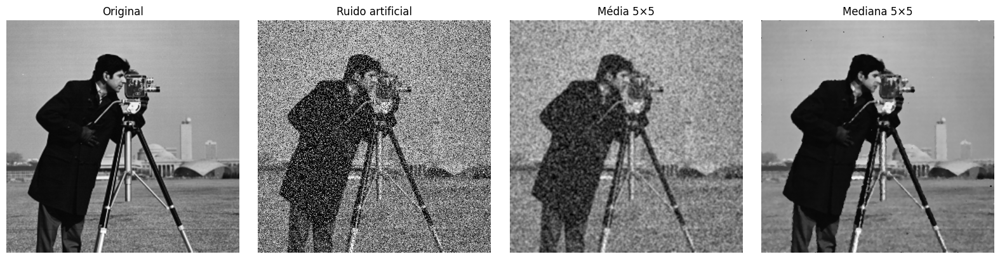

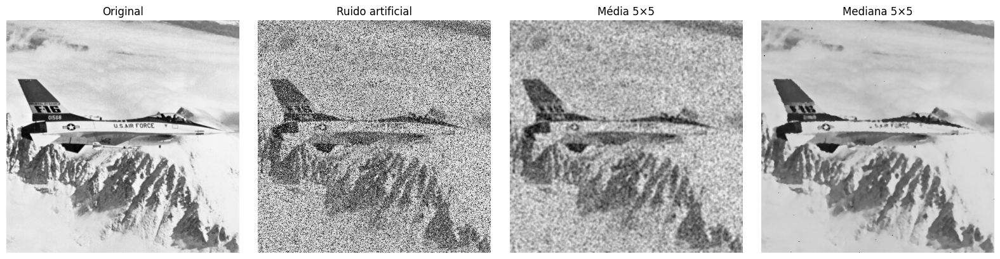

In [ ]:
camera_q2 = IMG_GRAY + "cameraman.tif"
jetplane_q2 = IMG_GRAY + "jetplane.tif"

gray = True

img_q2 = carregar_imagem(camera_q2, gray)
questao_2_resultado(img_q2, 5)

img_q2 = carregar_imagem(jetplane_q2, gray)
questao_2_resultado(img_q2, 5)

# Questão 3

Aplique o filtro Gaussiano em diferentes valores de desvio-padrão (σ) analisando seu impacto na suavização.

In [ ]:
def filtro_gaussiano(img, sigma):

  return cv2.GaussianBlur(img, (0, 0), sigmaX=sigma, sigmaY=sigma)

In [ ]:
def questao_3_resultado(img, sigmas):

  resultados = []

  for s in sigmas:

    resultado = filtro_gaussiano(img, s)
    resultados.append(resultado)

  plt.figure(figsize=(4 * (len(sigmas) + 1), 4))

  plt.subplot(1, len(sigmas) + 1, 1)
  plt.imshow(img, cmap='gray')
  plt.title("Original")
  plt.axis('off')

  pos = 2
  i = 0

  for s in sigmas:

    plt.subplot(1, len(sigmas) + 1, pos)
    plt.imshow(resultados[i], cmap='gray')
    plt.title("Sigma = " + str(s))
    plt.axis('off')

    pos = pos + 1
    i = i + 1

  plt.tight_layout()
  plt.show()

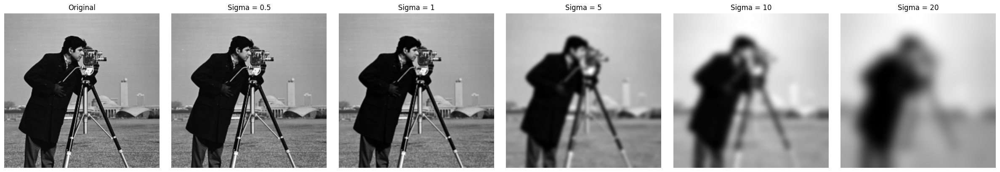

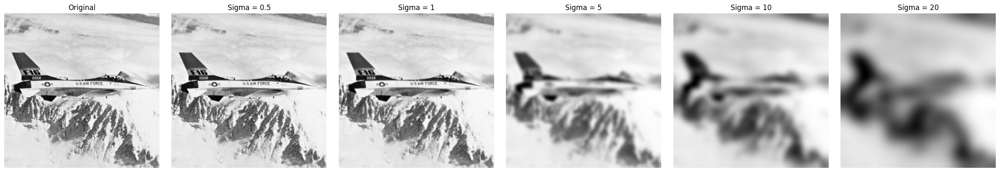

In [ ]:
camera_q3 = IMG_GRAY + "cameraman.tif"
jetplane_q3 = IMG_GRAY + "jetplane.tif"

gray = True

sigmas = [0.5, 1, 5, 10, 20]

img_q3 = carregar_imagem(camera_q3, gray)
questao_3_resultado(img_q3, sigmas)

img_q3 = carregar_imagem(jetplane_q3, gray)
questao_3_resultado(img_q3, sigmas)

# Questão 4

Implemente o filtro Laplaciano e compare diferentes configurações de
máscaras.

In [ ]:
def filtro_laplaciano(img, ksize):

  resp = cv2.Laplacian(img, cv2.CV_32F, ksize=ksize)
  resp_abs = np.abs(resp)
  resp_abs = cv2.normalize(resp_abs, None, 0, 255, cv2.NORM_MINMAX)

  return resp_abs.astype(np.uint8)

In [ ]:
def questao_4_resultado(img, ks):

  resultados = []

  for k in ks:

    print(k)
    lap = filtro_laplaciano(img, k)
    resultados.append(lap)

  plt.figure(figsize=(4 * (len(ks) + 1), 4))

  plt.subplot(1, len(ks) + 1, 1)
  plt.imshow(img, cmap='gray')
  plt.title("Original")
  plt.axis('off')

  pos = 2
  i = 0

  for k in ks:

    plt.subplot(1, len(ks) + 1, pos)
    plt.imshow(resultados[i], cmap='gray')
    plt.title("Laplaciano k=" + str(k))
    plt.axis('off')

    pos = pos + 1
    i = i + 1

  plt.tight_layout()
  plt.show()

1
3
5
7
9


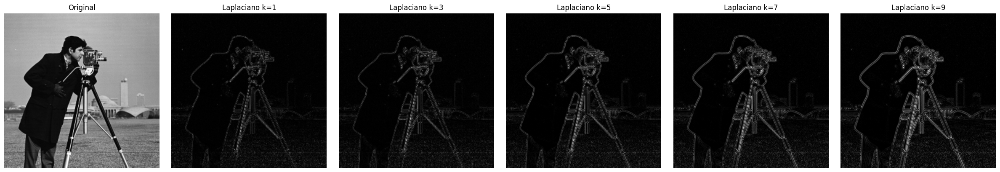

1
3
5
7
9


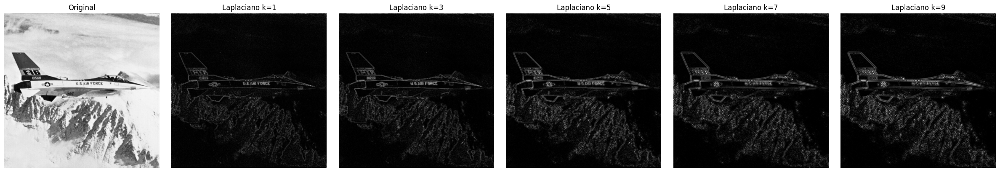

In [ ]:
camera_q4 = IMG_GRAY + "cameraman.tif"
jetplane_q4 = IMG_GRAY + "jetplane.tif"

gray = True

laplaciano = [1, 3, 5, 7, 9]

img_q4 = carregar_imagem(camera_q4, gray)
questao_4_resultado(img_q4, laplaciano)

img_q4 = carregar_imagem(jetplane_q4, gray)
questao_4_resultado(img_q4, laplaciano)

# Questão 5

Aplique o operador de Prewitt para detecção de bordas horizontais e verticais,
analisando imagens com ruído.

In [ ]:
def prewitt_x(img):

  kx = np.array([[-1, 0, 1],
                 [-1, 0, 1],
                 [-1, 0, 1]], dtype=np.float32)

  resp = cv2.filter2D(img, cv2.CV_32F, kx)
  resp = np.abs(resp)
  resp = cv2.normalize(resp, None, 0, 255, cv2.NORM_MINMAX)

  return resp.astype(np.uint8)

In [ ]:
def prewitt_y(img):

  ky = np.array([[ 1,  1,  1],
                 [ 0,  0,  0],
                 [-1, -1, -1]], dtype=np.float32)

  resp = cv2.filter2D(img, cv2.CV_32F, ky)
  resp = np.abs(resp)
  resp = cv2.normalize(resp, None, 0, 255, cv2.NORM_MINMAX)

  return resp.astype(np.uint8)

In [ ]:
def mostra_resultados_q5(img_orig, img_ruido, prewitt_x, prewitt_y, prewitt_combinada):

  plt.figure(figsize=(16, 4))

  plt.subplot(1, 5, 1)
  plt.imshow(img_orig, cmap='gray')
  plt.title("Imagem com original")
  plt.axis('off')

  plt.subplot(1, 5, 2)
  plt.imshow(img_ruido, cmap='gray')
  plt.title("Imagem com ruido")
  plt.axis('off')

  plt.subplot(1, 5, 3)
  plt.imshow(prewitt_x, cmap='gray')
  plt.title("Prewitt vertical")
  plt.axis('off')

  plt.subplot(1, 5, 4)
  plt.imshow(prewitt_y, cmap='gray')
  plt.title("Prewitt horizontal")
  plt.axis('off')

  plt.subplot(1, 5, 5)
  plt.imshow(prewitt_combinada, cmap='gray')
  plt.title("Combinada")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [ ]:
def questao_5_resultado(img, prob_ruido):

  img_ruido = ruido_artificial(img, prob_ruido)

  vert = prewitt_x(img_ruido)
  hori = prewitt_y(img_ruido)
  comb = magnitude_gradiente(vert, hori)

  mostra_resultados_q5(img, img_ruido, vert, hori, comb)

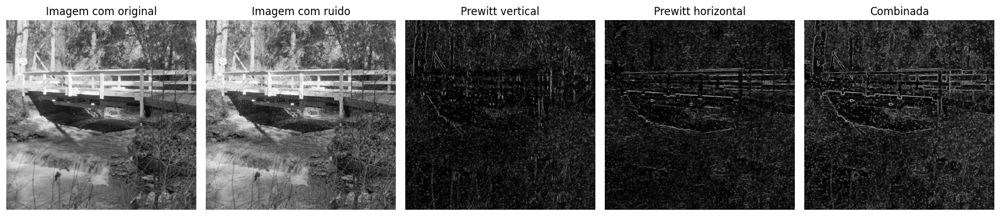

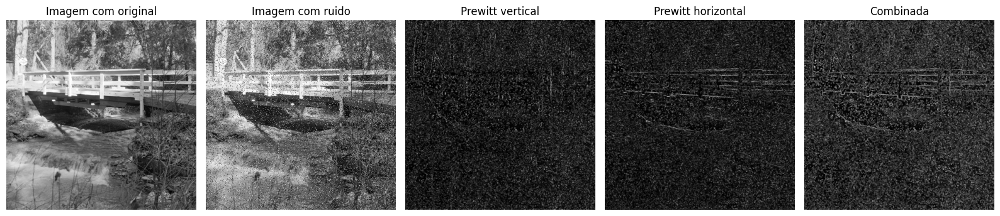

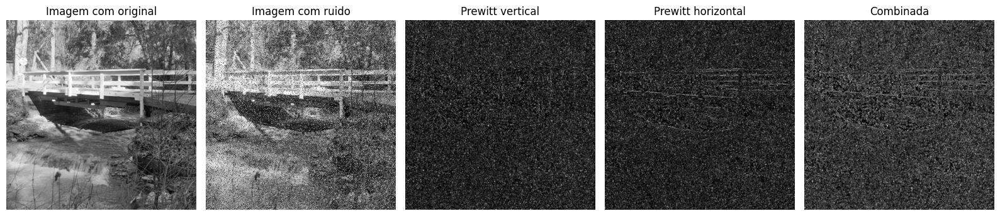

In [ ]:
walkbridge_q5 = IMG_GRAY + "walkbridge.tif"

gray = True

img_q5 = carregar_imagem(walkbridge_q5, gray)
questao_5_resultado(img_q5, 0.01)
questao_5_resultado(img_q5, 0.05)
questao_5_resultado(img_q5, 0.1)


# Questão 6

Aplique o operador de Sobel e compare com o de Prewitt, apresentando
magnitude e direção do gradiente.

In [ ]:
def direcao_gradiente(gx, gy):

  ang = np.arctan2(gy.astype(np.float32), gx.astype(np.float32))  # -pi..pi
  ang = (ang + np.pi) * (255.0 / (2.0 * np.pi))                   # 0..255 (visual)

  return ang.astype(np.uint8)

In [ ]:
def normaliza_abs(resp):

  resp = np.abs(resp)
  resp = cv2.normalize(resp, None, 0, 255, cv2.NORM_MINMAX)

  return resp.astype(np.uint8)

In [ ]:
def prewitt_x_raw(img):

  kx = np.array([[-1, 0, 1],
                 [-1, 0, 1],
                 [-1, 0, 1]], dtype=np.float32)

  return cv2.filter2D(img, cv2.CV_32F, kx)

In [ ]:
def prewitt_y_raw(img):

  ky = np.array([[ 1,  1,  1],
                 [ 0,  0,  0],
                 [-1, -1, -1]], dtype=np.float32)

  return cv2.filter2D(img, cv2.CV_32F, ky)

In [ ]:
def sobel_x_raw(img, ksize):

  return cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=ksize)

def sobel_y_raw(img, ksize):

  return cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=ksize)

In [ ]:
def mostra_resultados_q6(img_orig, img_ruido, pre_x_vis, pre_y_vis, pre_mag, pre_dir, sob_x_vis, sob_y_vis, sob_mag, sob_dir):

  plt.figure(figsize=(20, 10))

  plt.subplot(3, 4, 1)
  plt.imshow(img_orig, cmap='gray')
  plt.title("Original")
  plt.axis('off')

  plt.subplot(3, 4, 2)
  plt.imshow(img_ruido, cmap='gray')
  plt.title("Com ruido")
  plt.axis('off')

  plt.subplot(3, 4, 3)
  plt.axis('off')

  plt.subplot(3, 4, 4)
  plt.axis('off')

  #Prewitt
  plt.subplot(3, 4, 5)
  plt.imshow(pre_x_vis, cmap='gray')
  plt.title("Prewitt vertical")
  plt.axis('off')

  plt.subplot(3, 4, 6)
  plt.imshow(pre_y_vis, cmap='gray')
  plt.title("Prewitt horizontal")
  plt.axis('off')

  plt.subplot(3, 4, 7)
  plt.imshow(pre_mag, cmap='gray')
  plt.title("Prewitt combinado")
  plt.axis('off')

  plt.subplot(3, 4, 8)
  plt.imshow(pre_dir, cmap='gray')
  plt.title("Prewitt direção")
  plt.axis('off')

  #Sobel
  plt.subplot(3, 4, 9)
  plt.imshow(sob_x_vis, cmap='gray')
  plt.title("Sobel vertical")
  plt.axis('off')

  plt.subplot(3, 4, 10)
  plt.imshow(sob_y_vis, cmap='gray')
  plt.title("Sobel horizontal")
  plt.axis('off')

  plt.subplot(3, 4, 11)
  plt.imshow(sob_mag, cmap='gray')
  plt.title("Sobel combinado")
  plt.axis('off')

  plt.subplot(3, 4, 12)
  plt.imshow(sob_dir, cmap='gray')
  plt.title("Sobel direção")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [ ]:
def questao_6_resultado(img, prob_ruido, ksize):

  img_ruido = ruido_artificial(img, prob_ruido)

  #Prewitt
  pre_gx = prewitt_x_raw(img_ruido)
  pre_gy = prewitt_y_raw(img_ruido)

  pre_x_vis = normaliza_abs(pre_gx)
  pre_y_vis = normaliza_abs(pre_gy)

  pre_mag = magnitude_gradiente(pre_gx, pre_gy)
  pre_dir = direcao_gradiente(pre_gx, pre_gy)

  #Sobel
  sob_gx = sobel_x_raw(img_ruido, ksize)
  sob_gy = sobel_y_raw(img_ruido, ksize)

  sob_x_vis = normaliza_abs(sob_gx)
  sob_y_vis = normaliza_abs(sob_gy)

  sob_mag = magnitude_gradiente(sob_gx, sob_gy)
  sob_dir = direcao_gradiente(sob_gx, sob_gy)

  mostra_resultados_q6(img, img_ruido, pre_x_vis, pre_y_vis, pre_mag, pre_dir, sob_x_vis, sob_y_vis, sob_mag, sob_dir)

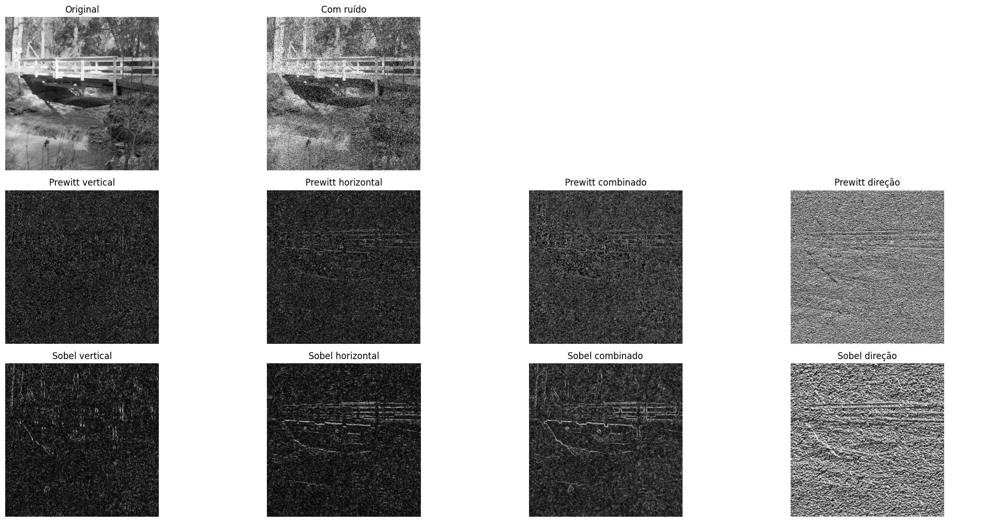

In [ ]:
img_q6 = carregar_imagem(walkbridge_q5, True)

#questao_6_resultado(img_q6, 0.05, 3)
#questao_6_resultado(img_q6, 0.1, 3)
questao_6_resultado(img_q6, 0.1, 9)

# Questão 7

Aplique técnicas de aguçamento por gradiente para realce de bordas,
comparando com filtros passa-alta.

In [ ]:
def aguca_grad(img, alpha, ksize):

  gx = cv2.Sobel(img, cv2.CV_32F, 1, 0, ksize=ksize)
  gy = cv2.Sobel(img, cv2.CV_32F, 0, 1, ksize=ksize)

  mag = np.sqrt(gx**2 + gy**2)
  mag = cv2.normalize(mag, None, 0, 255, cv2.NORM_MINMAX)

  sharp = img.astype(np.float32) + alpha * mag
  sharp = np.clip(sharp, 0, 255)

  return sharp.astype(np.uint8), mag.astype(np.uint8)

In [ ]:
def laplaciano_aux(img, ksize):

  return cv2.Laplacian(img, cv2.CV_32F, ksize=ksize)

def aguca_lapa(img, beta, ksize):

  lap = laplaciano_aux(img, ksize)

  sharp = img.astype(np.float32) + beta * lap
  sharp = np.clip(sharp, 0, 255)

  lap_vis = np.abs(lap)
  lap_vis = cv2.normalize(lap_vis, None, 0, 255, cv2.NORM_MINMAX)

  return sharp.astype(np.uint8), lap_vis.astype(np.uint8)

In [ ]:
def mostra_resultados_q7(img_orig, mag, sharp_grad, lap_vis, sharp_lap, alpha, beta):

  plt.figure(figsize=(18, 8))

  plt.subplot(2, 3, 1)
  plt.imshow(img_orig, cmap='gray')
  plt.title("Original")
  plt.axis('off')

  plt.subplot(2, 3, 2)
  plt.imshow(mag, cmap='gray')
  plt.title("Mag - Sobel")
  plt.axis('off')

  plt.subplot(2, 3, 3)
  plt.imshow(sharp_grad, cmap='gray')
  plt.title("Agucamento por gradiente (alfa=" + str(alpha) + ")")
  plt.axis('off')

  plt.subplot(2, 3, 5)
  plt.imshow(lap_vis, cmap='gray')
  plt.title("Passa-alta Laplaciano")
  plt.axis('off')

  plt.subplot(2, 3, 6)
  plt.imshow(sharp_lap, cmap='gray')
  plt.title("Agucamento por Laplaciano (beta=" + str(beta) + ")")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

In [ ]:
def questao_7_resultado(img, alpha, beta, sobel_ksize, lap_ksize):

  sharp_grad, mag = aguca_grad(img, alpha, sobel_ksize)
  sharp_lap, lap_vis = aguca_lapa(img, beta, lap_ksize)

  mostra_resultados_q7(img, mag, sharp_grad, lap_vis, sharp_lap, alpha, beta)

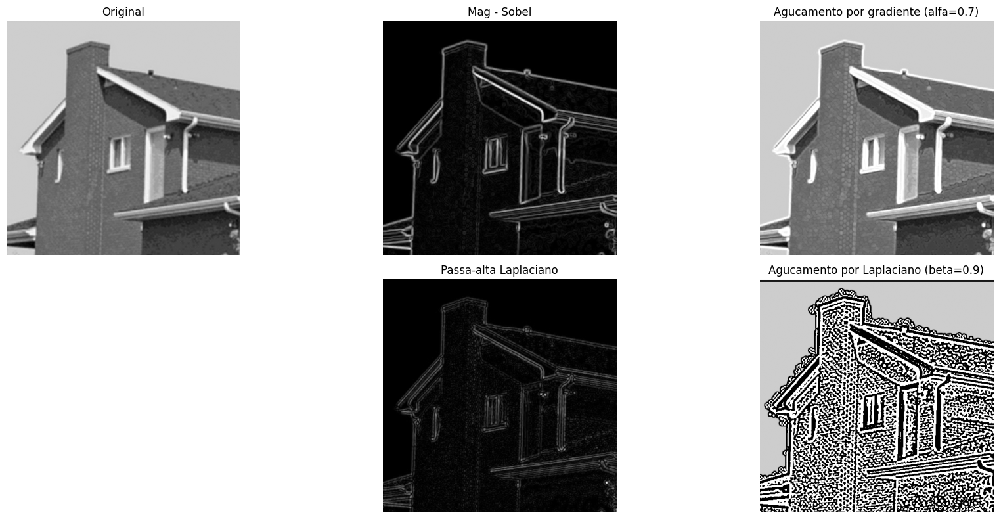

In [ ]:
house_q7 = IMG_GRAY + "house.tif"

gray = True

img_q7 = carregar_imagem(house_q7, gray)
questao_7_resultado(img_q7, 0.7, 0.9, 9, 9)

# Questão 8

Realize a análise e modificação de histogramas, contemplando três etapas:
cálculo e interpretação do histograma da imagem, aplicação da equalização de histograma em imagens de baixo contraste e utilização da especificação de histograma (matching) para ajustar uma imagem ao histograma de referência.

In [ ]:
def calcula_cdf_do_histograma(histograma):

  cdf = histograma.cumsum()
  cdf = cdf / cdf[-1]

  return cdf

In [ ]:
def mostra_imagem_e_histograma(img, titulo):

  hist = calcula_histograma(img)

  plt.figure(figsize=(14, 4))

  plt.subplot(1, 2, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title(titulo)
  plt.axis('off')

  plt.subplot(1, 2, 2)
  plt.plot(hist)
  plt.title("Histograma")
  plt.xlim([0, 255])
  plt.xlabel("Intensidade")
  plt.ylabel("Frequência")

  plt.tight_layout()
  plt.show()

In [ ]:
def equaliza_histograma(img):

  return cv2.equalizeHist(img)

In [ ]:
def mostra_equalizacao(img, titulo):

  imagem_equalizada = equaliza_histograma(img)

  hist_original = calcula_histograma(img)
  hist_equalizado = calcula_histograma(imagem_equalizada)

  plt.figure(figsize=(18, 6))

  plt.subplot(2, 2, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Original")
  plt.axis('off')

  plt.subplot(2, 2, 2)
  plt.plot(hist_original)
  plt.title("Histograma Original")
  plt.xlim([0, 255])

  plt.subplot(2, 2, 3)
  plt.imshow(imagem_equalizada, cmap='gray', vmin=0, vmax=255)
  plt.title("Equalizada")
  plt.axis('off')

  plt.subplot(2, 2, 4)
  plt.plot(hist_equalizado)
  plt.title("Histograma Equalizado")
  plt.xlim([0, 255])

  plt.suptitle(titulo)
  plt.tight_layout()
  plt.show()

  return imagem_equalizada

In [ ]:
def especifica_histograma(img, img_ref):

  hist_fonte = calcula_histograma(img)
  hist_ref = calcula_histograma(img_ref)

  cdf_fonte = calcula_cdf_do_histograma(hist_fonte)
  cdf_ref = calcula_cdf_do_histograma(hist_ref)

  tabela_mapeamento = np.zeros(256, dtype=np.uint8)

  for i in range(256):

    j = np.argmin(np.abs(cdf_ref - cdf_fonte[i]))
    tabela_mapeamento[i] = j

  imagem_ajustada = cv2.LUT(img, tabela_mapeamento)

  return imagem_ajustada

In [ ]:
def mostra_especificacao_histograma(img, img_ref, titulo):

  imagem_ajustada = especifica_histograma(img, img_ref)

  hist_fonte = calcula_histograma(img)
  hist_ref = calcula_histograma(img_ref)
  hist_ajustada = calcula_histograma(imagem_ajustada)

  cdf_fonte = calcula_cdf_do_histograma(hist_fonte)
  cdf_ref = calcula_cdf_do_histograma(hist_ref)
  cdf_ajustada = calcula_cdf_do_histograma(hist_ajustada)

  plt.figure(figsize=(20, 10))

  #Imagens
  plt.subplot(3, 3, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Fonte")
  plt.axis('off')

  plt.subplot(3, 3, 2)
  plt.imshow(img_ref, cmap='gray', vmin=0, vmax=255)
  plt.title("Referência")
  plt.axis('off')

  plt.subplot(3, 3, 3)
  plt.imshow(imagem_ajustada, cmap='gray', vmin=0, vmax=255)
  plt.title("Fonte ajustada")
  plt.axis('off')

  #Histogramas
  plt.subplot(3, 3, 4); plt.plot(hist_fonte); plt.title("Hist fonte"); plt.xlim([0, 255])
  plt.subplot(3, 3, 5); plt.plot(hist_ref); plt.title("Hist referência"); plt.xlim([0, 255])
  plt.subplot(3, 3, 6); plt.plot(hist_ajustada); plt.title("Hist ajustada"); plt.xlim([0, 255])

  #CDFs
  plt.subplot(3, 3, 7); plt.plot(cdf_fonte); plt.title("CDF fonte"); plt.xlim([0, 255]); plt.ylim([0, 1])
  plt.subplot(3, 3, 8); plt.plot(cdf_ref); plt.title("CDF referência"); plt.xlim([0, 255]); plt.ylim([0, 1])
  plt.subplot(3, 3, 9); plt.plot(cdf_ajustada); plt.title("CDF ajustada"); plt.xlim([0, 255]); plt.ylim([0, 1])

  plt.suptitle(titulo)
  plt.tight_layout()
  plt.show()

  return imagem_ajustada

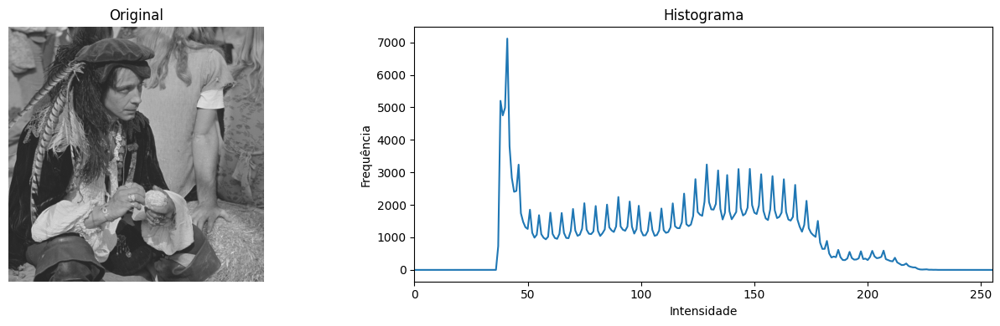

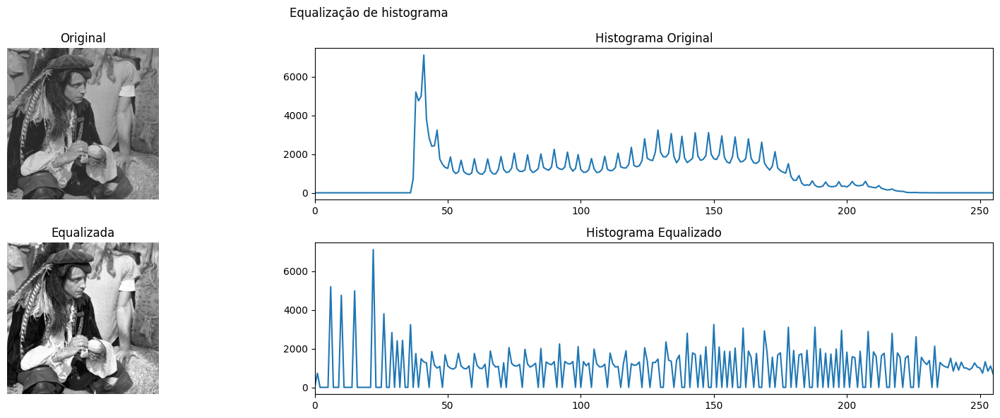

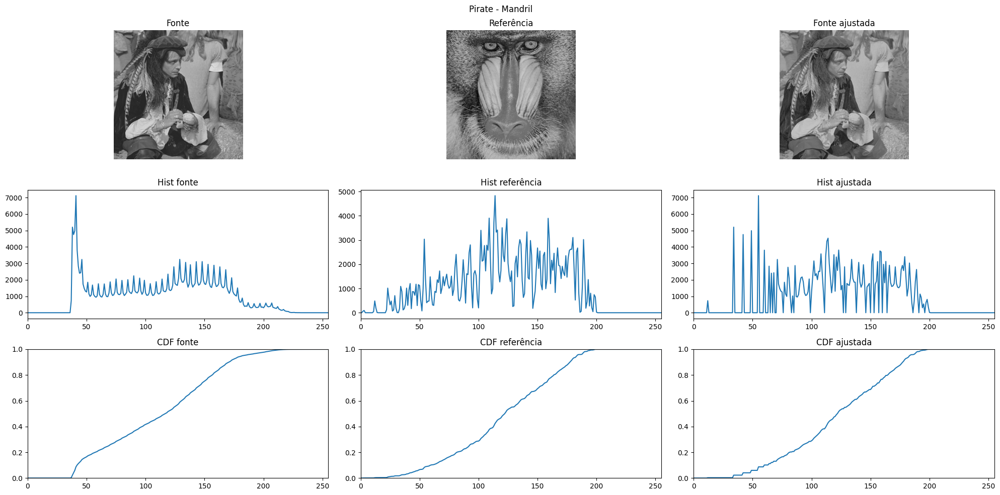

In [ ]:
pirate_q8 = IMG_GRAY + "pirate.tif"
mandril_ref_q8 = IMG_GRAY + "mandril_color.tif"

gray = True

img_pirate_q8 = carregar_imagem(pirate_q8, gray)
img_mandril_q8   = carregar_imagem(mandril_ref_q8, gray)

mostra_imagem_e_histograma(img_pirate_q8, "Original")

img_equalizada = mostra_equalizacao(img_pirate_q8, "Equalização de histograma")

img_especificada = mostra_especificacao_histograma(img_pirate_q8, img_mandril_q8, "Pirate - Mandril")

# Questão 9

Implemente a limiarização simples com diferentes valores de limiar.

In [ ]:
def limiarizacao_simples(img, limiar):

  _, img_limiarizada = cv2.threshold(img, limiar, 255, cv2.THRESH_BINARY)

  return img_limiarizada

In [ ]:
def mostra_resultados_q9(img, lista):

  n = len(lista)

  plt.figure(figsize=(4 * (n + 1), 4))

  #Original
  plt.subplot(1, n + 1, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Original")
  plt.axis('off')

  #Limiarizadas
  for i, limiar in enumerate(lista):

    img_limiarizada = limiarizacao_simples(img, limiar)

    plt.subplot(1, n + 1, i + 2)
    plt.imshow(img_limiarizada, cmap='gray', vmin=0, vmax=255)
    plt.title(f"Limiar = {limiar}")
    plt.axis('off')

  plt.tight_layout()
  plt.show()

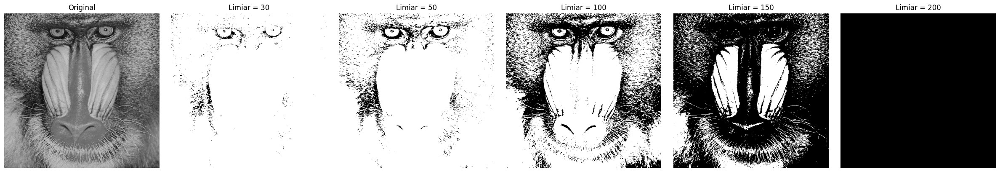

In [ ]:
mandril_q9 = IMG_GRAY + "mandril_color.tif"

gray = True

img_mandril_q9 = carregar_imagem(mandril_q9, gray)

lista_limiares = [30, 50, 100, 150, 200]

mostra_resultados_q9(img_mandril_q9, lista_limiares)

# Questão 10

Aplique técnicas de multilimiarização para separar mais de duas regiões em
uma mesma imagem.

In [ ]:
def multilimiarizacao(img, lista_limiais):

  lista_limiais = sorted(lista_limiais)

  saida = np.zeros_like(img, dtype=np.uint8)

  limites = [0] + lista_limiais + [256]

  niveis = np.linspace(0, 255, len(limites) - 1, dtype=np.uint8)

  for i in range(len(limites) - 1):

    mascara = (img >= limites[i]) & (img < limites[i + 1])
    saida[mascara] = niveis[i]

  return saida

In [ ]:
def mostra_resultados_q10(img, lista_limiais):

  img_multi = multilimiarizacao(img, lista_limiais)

  plt.figure(figsize=(12, 4))

  plt.subplot(1, 2, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Original"); plt.axis('off')
  plt.subplot(1, 2, 2)
  plt.imshow(img_multi, cmap='gray', vmin=0, vmax=255)

  plt.title(f"Multi {lista_limiais}")
  plt.axis('off')
  plt.tight_layout()
  plt.show()

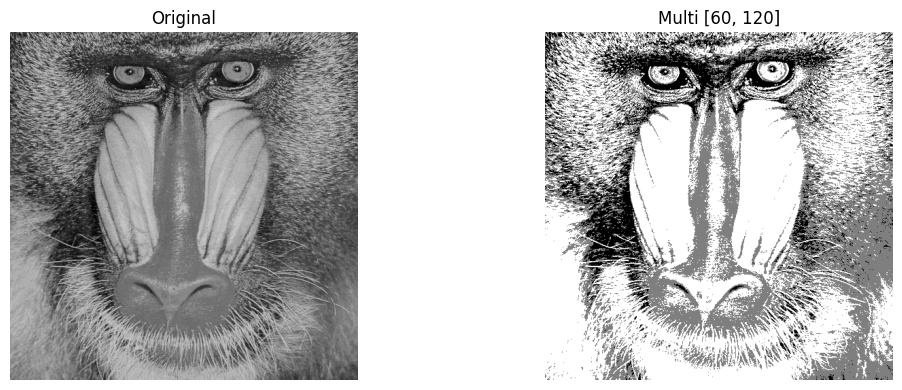

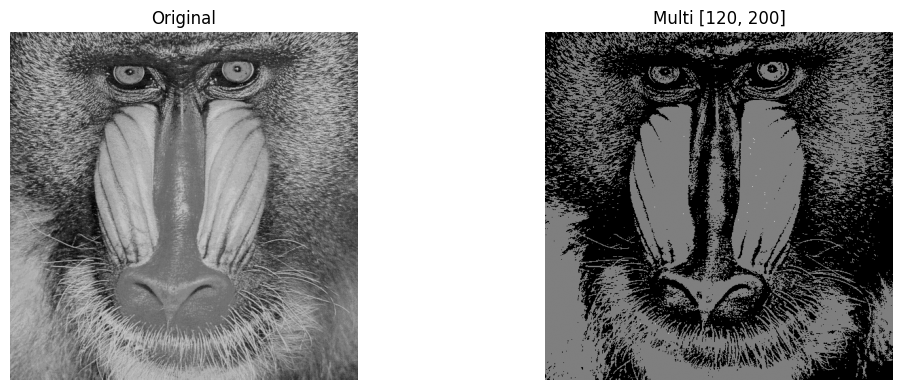

In [ ]:
mandril_q10 = IMG_GRAY + "mandril_color.tif"

gray = True

img_mandril_q10 = carregar_imagem(mandril_q10, gray)

lista_limiares = [60, 120]

mostra_resultados_q10(img_mandril_q10, lista_limiares)

lista_limiares = [120, 200]

mostra_resultados_q10(img_mandril_q10, lista_limiares)

# Questão 11

Aplique a limiarização automática pelo método de Otsu, comparando com os
resultados das questões anteriores.

In [ ]:
def otsu_q11(img):

  limiar_otsu, img_otsu = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

  return img_otsu, limiar_otsu

In [ ]:
def mostra_resultados_q11(img):

  img_otsu, limiar_otsu = otsu_q11(img)
  hist_original = calcula_histograma(img)

  plt.figure(figsize=(18, 6))

  plt.subplot(1, 3, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Original")
  plt.axis('off')

  plt.subplot(1, 3, 2)
  plt.plot(hist_original)
  plt.axvline(limiar_otsu, linestyle='--')
  plt.title(f"Limiar = {int(limiar_otsu)}")
  plt.xlim([0, 255])
  plt.xlabel("Intensidade")
  plt.ylabel("Frequência")

  plt.subplot(1, 3, 3)
  plt.imshow(img_otsu, cmap='gray', vmin=0, vmax=255)
  plt.title("Otsu")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

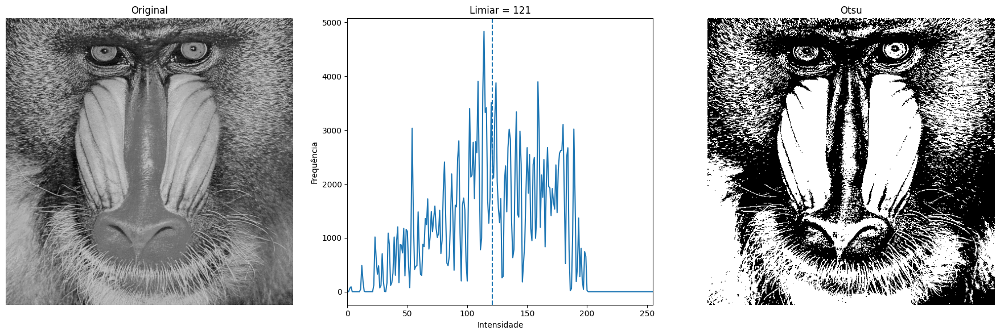

In [ ]:
mandril_q11 = IMG_GRAY + "mandril_color.tif"

gray = True

img_mandril_q11 = carregar_imagem(mandril_q11, gray)

mostra_resultados_q11(img_mandril_q11)

# Questão 12

Realize operações aritméticas (soma, subtração, multiplicação e divisão) entre
imagens.

In [ ]:
def mostra_resultados_q12(img1, img2, img3, img_soma, img_sub, img_mult, img_div):

  plt.figure(figsize=(16, 8))

  plt.subplot(2, 4, 1)
  plt.imshow(img1, cmap='gray', vmin=0, vmax=255)
  plt.axis('off')

  plt.subplot(2, 4, 2)
  plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
  plt.axis('off')

  plt.subplot(2, 4, 3)
  plt.imshow(img3, cmap='gray', vmin=0, vmax=255)
  plt.axis('off')

  plt.subplot(2, 4, 4)
  plt.axis('off')

  plt.subplot(2, 4, 5)
  plt.imshow(img_soma, cmap='gray', vmin=0, vmax=255)
  plt.title("Soma")
  plt.axis('off')

  plt.subplot(2, 4, 6)
  plt.imshow(img_sub, cmap='gray', vmin=0, vmax=255)
  plt.title("Subtração")
  plt.axis('off')

  plt.subplot(2, 4, 7)
  plt.imshow(img_mult, cmap='gray', vmin=0, vmax=255)
  plt.title("Multiplicação")
  plt.axis('off')

  plt.subplot(2, 4, 8)
  plt.imshow(img_div, cmap='gray', vmin=0, vmax=255)
  plt.title("Divisão")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

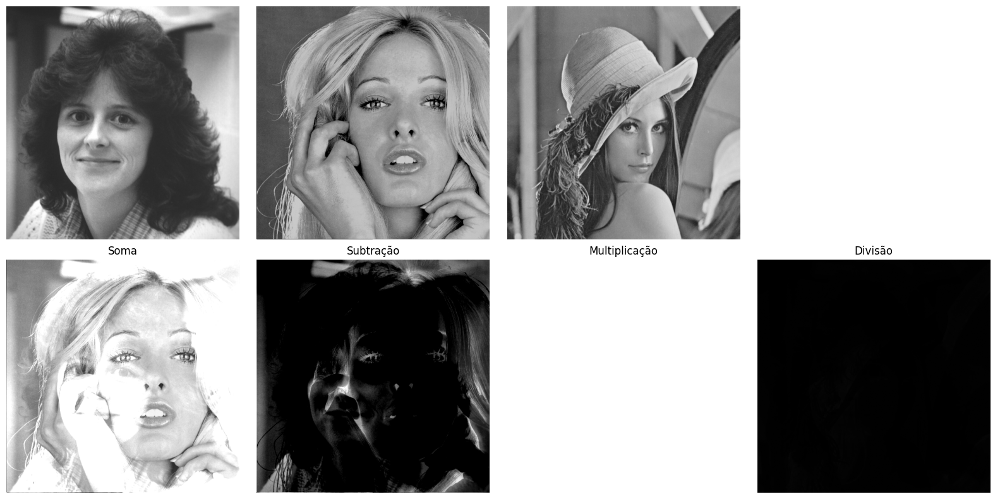

In [ ]:
woman_darkhair_q12 = IMG_GRAY + "woman_darkhair.tif"
woman_blonde_q12 = IMG_GRAY + "woman_blonde.tif"
lena_q12 = IMG_GRAY + "lena_gray_512.tif"

gray = True

img_woman_darkhair_q12 = carregar_imagem(woman_darkhair_q12, gray)
img_woman_blonde_q12 = carregar_imagem(woman_blonde_q12, gray)
img_lena_q12 = carregar_imagem(lena_q12, gray)

img_soma_q12 = cv2.add(img_woman_darkhair_q12, img_woman_blonde_q12)
img_subtracao_q12 = cv2.subtract(img_woman_darkhair_q12, img_woman_blonde_q12)
img_multiplicacao_q12 = cv2.multiply(img_woman_darkhair_q12, img_lena_q12)
img_divisao_q12 = cv2.divide(img_woman_darkhair_q12, img_lena_q12)

mostra_resultados_q12(img_woman_darkhair_q12, img_woman_blonde_q12, img_lena_q12, img_soma_q12, img_subtracao_q12, img_multiplicacao_q12, img_divisao_q12)

# Questão 13

Aplique operações lógicas (AND, OR, XOR e NOT) em imagens binárias para
segmentação e uso de máscaras.

In [ ]:
def mostra_resultados_q13(img1, img2, img_and, img_or, img_xor, img_not):

  plt.figure(figsize=(16, 8))

  plt.subplot(2, 4, 1)
  plt.imshow(img1, cmap='gray', vmin=0, vmax=255)
  plt.title("Bat "); plt.axis('off')

  plt.subplot(2, 4, 2)
  plt.imshow(img2, cmap='gray', vmin=0, vmax=255)
  plt.title("Rat")
  plt.axis('off')

  plt.subplot(2, 4, 3)
  plt.axis('off')
  plt.subplot(2, 4, 4)
  plt.axis('off')

  plt.subplot(2, 4, 5)
  plt.imshow(img_and, cmap='gray', vmin=0, vmax=255)
  plt.title("AND"); plt.axis('off')

  plt.subplot(2, 4, 6)
  plt.imshow(img_or,  cmap='gray', vmin=0, vmax=255)
  plt.title("OR");  plt.axis('off')

  plt.subplot(2, 4, 7)
  plt.imshow(img_xor, cmap='gray', vmin=0, vmax=255)
  plt.title("XOR"); plt.axis('off')

  plt.subplot(2, 4, 8)
  plt.imshow(img_not, cmap='gray', vmin=0, vmax=255)
  plt.title("NOT")

  plt.axis('off')

  plt.tight_layout()
  plt.show()

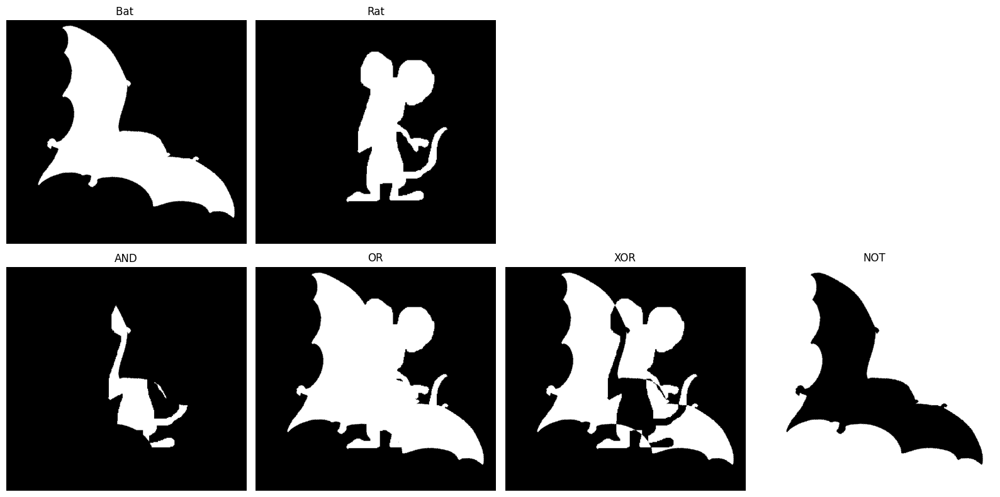

In [ ]:
bat_1_q13 = IMG_BINA + "bat-1.gif"
rat_4_q13 = IMG_BINA + "rat-04.gif"

gray = True

img_bat_1_q13 = carregar_imagem(bat_1_q13, gray)
img_rat_4_q13 = carregar_imagem(rat_4_q13, gray)

_, img_bat_bin = cv2.threshold(img_bat_1_q13, 127, 255, cv2.THRESH_BINARY)
_, img_rat_bin = cv2.threshold(img_rat_4_q13, 127, 255, cv2.THRESH_BINARY)

h, w = img_bat_bin.shape
img_rat_bin = cv2.resize(img_rat_bin, (w, h), interpolation=cv2.INTER_NEAREST)

img_and = cv2.bitwise_and(img_bat_bin, img_rat_bin)
img_or  = cv2.bitwise_or(img_bat_bin, img_rat_bin)
img_xor = cv2.bitwise_xor(img_bat_bin, img_rat_bin)
img_not = cv2.bitwise_not(img_bat_bin)

mostra_resultados_q13(img_bat_bin, img_rat_bin, img_and, img_or, img_xor, img_not)

# Questão 14

Aplique transformações geométricas em imagens binárias, realizando
separadamente e em combinação operações de translação, rotação, escala e cisalhamento (vertical e horizontal).

In [ ]:
def transforma_translacao(img, tx, ty):

  h, w = img.shape
  M = np.float32([[1, 0, tx], [0, 1, ty]])

  return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_NEAREST, borderValue=0)

def transforma_rotacao(img, angulo_graus):

  h, w = img.shape
  centro = (w // 2, h // 2)

  M = cv2.getRotationMatrix2D(centro, angulo_graus, 1.0)

  return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_NEAREST, borderValue=0)

def transforma_escala(img, escala_x, escala_y):

  h, w = img.shape
  M = np.float32([[escala_x, 0, 0], [0, escala_y, 0]])

  return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_NEAREST, borderValue=0)

def transforma_cisalhamento_horizontal(img, shx):

  h, w = img.shape
  M = np.float32([[1, shx, 0], [0, 1, 0]])

  return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_NEAREST, borderValue=0)

def transforma_cisalhamento_vertical(img, shy):

  h, w = img.shape
  M = np.float32([[1, 0, 0], [shy, 1, 0]])

  return cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_NEAREST, borderValue=0)

In [ ]:
def transforma_combinada(img, tx, ty, angulo_graus, escala_x, escala_y, shx, shy):

  h, w = img.shape

  T = np.float32([[1, 0, tx], [0, 1, ty], [0, 0, 1]])

  S = np.float32([[escala_x, 0, 0], [0, escala_y, 0], [0, 0, 1]])

  Shx = np.float32([[1, shx, 0], [0, 1, 0], [0, 0, 1]])

  Shy = np.float32([[1, 0, 0], [shy, 1, 0], [0, 0, 1]])

  centro = (w // 2, h // 2)

  R2 = cv2.getRotationMatrix2D(centro, angulo_graus, 1.0)

  R = np.float32([[R2[0,0], R2[0,1], R2[0,2]],
                  [R2[1,0], R2[1,1], R2[1,2]],
                  [0,      0,      1]])

  M = T @ R @ Shy @ Shx @ S

  return cv2.warpPerspective(img, M, (w, h), flags=cv2.INTER_NEAREST, borderValue=0)

In [ ]:
def mostra_resultados_q14(img):

  img_trans = transforma_translacao(img, tx=40, ty=20)

  img_rot = transforma_rotacao(img, angulo_graus=25)

  img_esc = transforma_escala(img, escala_x=1.2, escala_y=0.8)

  img_shx = transforma_cisalhamento_horizontal(img, shx=0.3)

  img_shy = transforma_cisalhamento_vertical(img, shy=0.3)

  img_comb = transforma_combinada(img, tx=30, ty=15, angulo_graus=20, escala_x=1.1, escala_y=1.1, shx=0.2, shy=0.15)

  plt.figure(figsize=(10, 6))

  plt.subplot(2, 3, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Original")
  plt.axis('off')

  plt.subplot(2, 3, 2)
  plt.imshow(img_trans,   cmap='gray', vmin=0, vmax=255)
  plt.title("Translação")
  plt.axis('off')

  plt.subplot(2, 3, 3)
  plt.imshow(img_rot,     cmap='gray', vmin=0, vmax=255)
  plt.title("Rotação")
  plt.axis('off')

  plt.subplot(2, 3, 4)
  plt.imshow(img_esc,     cmap='gray', vmin=0, vmax=255)
  plt.title("Escala")
  plt.axis('off')

  plt.subplot(2, 3, 5)
  plt.imshow(img_shx,     cmap='gray', vmin=0, vmax=255)
  plt.title("Cisalhamento H")
  plt.axis('off')

  plt.subplot(2, 3, 6)
  plt.imshow(img_shy,     cmap='gray', vmin=0, vmax=255)
  plt.title("Cisalhamento V")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

  plt.figure(figsize=(5, 3))
  plt.imshow(img_comb, cmap='gray', vmin=0, vmax=255)
  plt.title("Combinada")
  plt.axis('off')
  plt.tight_layout()
  plt.show()

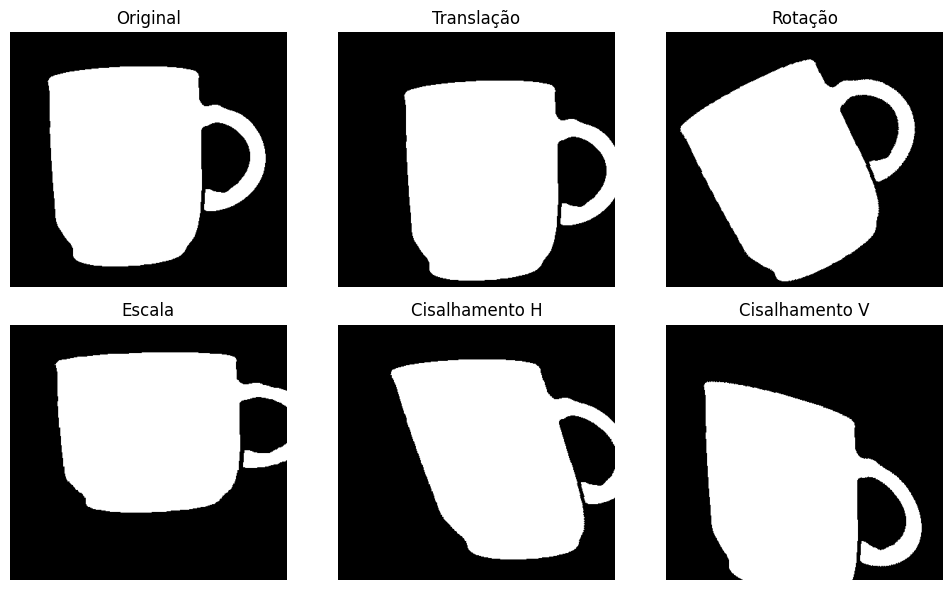

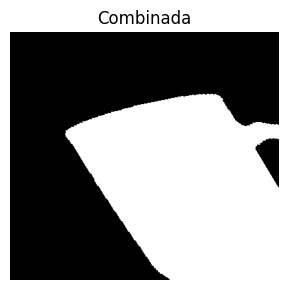

In [ ]:
cup_15_q14 = IMG_BINA + "cup-15.gif"

gray = True

img_cup_15_q14 = carregar_imagem(cup_15_q14, gray)

_, img_cup_15_bin = cv2.threshold(img_cup_15_q14, 127, 255, cv2.THRESH_BINARY)

mostra_resultados_q14(img_cup_15_bin)

# Questão 15

Implemente a transformação negativa da imagem e discuta sua utilidade em
imagens de baixo contraste.

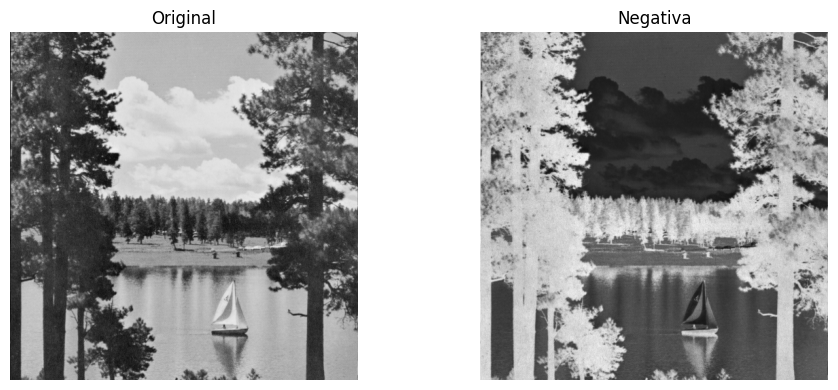

In [ ]:
lake_q15 = IMG_GRAY + "lake.tif"

gray = True

img_lake_15 = carregar_imagem(lake_q15, gray)

img_negativa_q15 = 255 - img_lake_15

plt.figure(figsize=(10, 4))

plt.subplot(1, 2, 1)
plt.imshow(img_lake_15, cmap='gray', vmin=0, vmax=255)
plt.title("Original")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img_negativa_q15, cmap='gray', vmin=0, vmax=255)
plt.title("Negativa")
plt.axis('off')

plt.tight_layout()
plt.show()

# Questão 16

Aplique e compare as transformações de intensidade linear, logarítmica e
exponencial, destacando seus efeitos em imagens escuras, de baixo brilho e de baixo contraste.

In [ ]:
def transformacao_linear(img, a, b):

  img_lin = a * img + b
  img_lin = np.clip(img_lin, 0, 255)

  return img_lin.astype(np.uint8)

In [ ]:
def transformacao_logaritmica(img):

  img_norm = img.astype(np.float32)

  c = 255 / np.log(1 + np.max(img_norm))

  img_log = c * np.log(1 + img_norm)

  return img_log.astype(np.uint8)

In [ ]:
def transformacao_exponencial(img, gamma):

  img_norm = img.astype(np.float32) / 255.0

  img_exp = np.power(img_norm, gamma)

  img_exp = np.clip(img_exp * 255, 0, 255)

  return img_exp.astype(np.uint8)

In [ ]:
def mostra_resultados_q16(img):

  img_linear = transformacao_linear(img, 1.3, 0)
  img_log = transformacao_logaritmica(img)
  img_exp = transformacao_exponencial(img, 0.5)

  plt.figure(figsize=(14, 6))

  plt.subplot(1, 4, 1)
  plt.imshow(img, cmap='gray', vmin=0, vmax=255)
  plt.title("Original")
  plt.axis('off')

  plt.subplot(1, 4, 2)
  plt.imshow(img_linear, cmap='gray', vmin=0, vmax=255)
  plt.title("Linear")
  plt.axis('off')

  plt.subplot(1, 4, 3)
  plt.imshow(img_log, cmap='gray', vmin=0, vmax=255)
  plt.title("Logaritmica")
  plt.axis('off')

  plt.subplot(1, 4, 4)
  plt.imshow(img_exp, cmap='gray', vmin=0, vmax=255)
  plt.title("Exponencial")
  plt.axis('off')

  plt.tight_layout()
  plt.show()

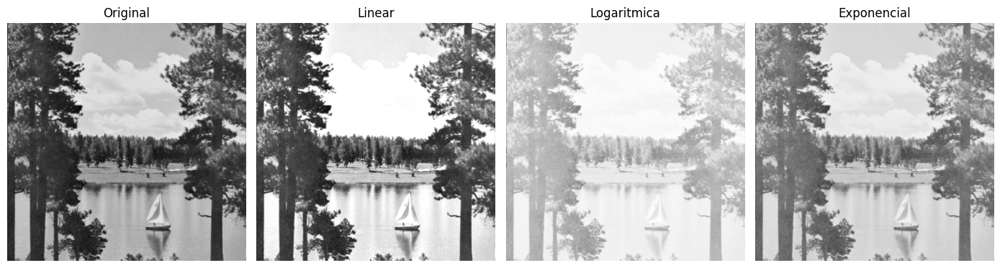

In [ ]:
lake_q16 = IMG_GRAY + "lake.tif"

gray = True

img_lake_16 = carregar_imagem(lake_q16, gray)

mostra_resultados_q16(img_lake_16)

# Questão 17

Implemente a transformação gama (correção de potência), testando valores de
γ menores e maiores que 1.

In [ ]:
def transformacao_gama(img, gamma):

  img_norm = img.astype(np.float32) / 255.0

  img_gama = np.power(img_norm, gamma)

  img_gama = np.clip(img_gama * 255, 0, 255)

  return img_gama.astype(np.uint8)

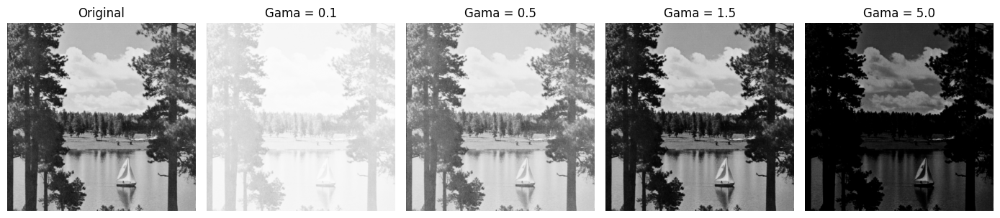

In [ ]:
lake_q17 = IMG_GRAY + "lake.tif"

gray = True

img_lake_17 = carregar_imagem(lake_q17, gray)

img_gama_01 = transformacao_gama(img_lake_17, gamma=0.1)
img_gama_05  = transformacao_gama(img_lake_17, gamma=0.5)
img_gama_15  = transformacao_gama(img_lake_17, gamma=1.5)
img_gama_5  = transformacao_gama(img_lake_17, gamma=5.0)

plt.figure(figsize=(14, 5))

plt.subplot(1, 5, 1)
plt.imshow(img_lake_17, cmap='gray', vmin=0, vmax=255)
plt.title("Original")
plt.axis('off')

plt.subplot(1, 5, 2)
plt.imshow(img_gama_01, cmap='gray', vmin=0, vmax=255)
plt.title("Gama = 0.1")
plt.axis('off')

plt.subplot(1, 5, 3)
plt.imshow(img_gama_05, cmap='gray', vmin=0, vmax=255)
plt.title("Gama = 0.5")
plt.axis('off')

plt.subplot(1, 5, 4)
plt.imshow(img_gama_15, cmap='gray', vmin=0, vmax=255)
plt.title("Gama = 1.5")
plt.axis('off')

plt.subplot(1, 5, 5)
plt.imshow(img_gama_5, cmap='gray', vmin=0, vmax=255)
plt.title("Gama = 5.0")
plt.axis('off')

plt.tight_layout()
plt.show()